In [2]:
%matplotlib inline


from keras.models import Model, load_model
from keras import backend as K
from keras.callbacks import TensorBoard, EarlyStopping
from keras.layers import LSTM, Dropout, Dense, BatchNormalization, Activation, Input, TimeDistributed
from keras.regularizers import l2
from keras.layers.advanced_activations import LeakyReLU, ELU, PReLU
from keras.optimizers import RMSprop, Adam, Adadelta, Adagrad
from keras.utils import to_categorical
import numpy as np
from time import time
from matplotlib import pyplot as plt
import pandas as pd

from assignment.helpers import datapreparation as prep



fs1_dirpath = "./assignment/datasets/training/piano_roll_fs1"
fs2_dirpath = "./assignment/datasets/training/piano_roll_fs2"
fs5_dirpath = "./assignment/datasets/training/piano_roll_fs5"


# Load initial data
datasets = prep.load_all_dataset(fs2_dirpath)
dataset_names = prep.load_all_dataset_names(fs2_dirpath)
unique_names = set()
for name in dataset_names: # Make sure the same names get the same encoding each run
    unique_names.add(name)
unique_names = list(unique_names)
name_to_int = dict([(unique_names[i], i) for i in range(len(unique_names))])
int_to_name = dict([(i, unique_names[i]) for i in range(len(unique_names))])
dataset_names = to_categorical([name_to_int[name] for name in dataset_names]) # one-hot encode the composers
datasets = [dataset[:, 1:] for dataset in datasets] # Remove the headers

# Setting initial parameters
dataset_id_names = dict(zip(np.arange(len(dataset_names)), dataset_names))
longest_song = max(datasets[i].shape[1] for i in range(len(datasets)))
sequence_length = 32
length = longest_song//sequence_length + 1
num_keys = len(datasets[0])
parts_per_song = int(longest_song/sequence_length)
composer_encoding_len=len(dataset_names[0]) # 4 composers

# Makes several datasets from this first one with differing intervals between to capture the "gaps" between two sequences
# Add each subsequence of each song with differing offsets ([0:10], [1:11], [2:12], ...) to retain information.
# Unable to implement stateful, so try to retain as much information between subsequences as possible. 
# (known bug where you cant seed hidden state of an LSTM and call reset_state())
# Also a way of dataset augmentation (regularization) by increasing the size of the dataset

def transpose_and_label_more(dataset_names, datasets, num_keys):
    zs = []
    datasets_transposed = np.array([(datasets[i].T, dataset_names[i]) for i in range(len(datasets))])
    for song, composer in datasets_transposed:
        for offset in range(0, sequence_length, 2):
            for i in range(0, len(song)//sequence_length-offset):
                x = song[offset+i*sequence_length:offset+(i+1)*sequence_length]
                if i == len(song)//sequence_length - (1+offset): # Add the EOF marker if last seq of song
                    y = np.append(song[offset+i*sequence_length+1:offset+(i+1)*sequence_length], np.array([np.ones(num_keys)]), 0)
                else:
                    y = song[offset+i*sequence_length+1:offset+(i+1)*sequence_length+1]
                zs.append((x, y, composer))
    np.random.shuffle(zs)
    xs, ys, composers = [], [], []
    for x, y, composer in zs:
        xs.append(x)
        ys.append(y)
        composers.append(composer)
    return np.array(xs), np.array(ys), np.array(composers)



def make_song_from_predict(model, initial_data, limit):
    song = []
    keep_producing = True
    prev_data = initial_data
    while keep_producing and len(song) < limit:
        predictions = model.predict(np.array([prev_data]))[0]
        labels = np.zeros(128)
        labels[predictions[-1]/np.max(predictions[-1])>0.75] = 1 # Threshold to consider the key as active, binarized based on this
        keep_producing = np.sum(labels) != len(labels)
        song.append(labels)
        prev_data = np.append(prev_data[1:], [labels], 0)
    return np.array(song)

def make_song_from_predict_composer(model, initial_data, composer, limit):
    song = []
    keep_producing = True
    prev_data = initial_data
    while keep_producing and len(song) < limit:
        predictions = model.predict([np.array([prev_data]), composer])[0]
        labels = np.zeros(128)
        labels[predictions[-1]/np.max(predictions[-1])>0.75] = 1 # Threshold to consider the key as active, binarized based on this
        keep_producing = np.sum(labels) != len(labels)
        song.append(labels)
        prev_data = np.append(prev_data[1:], [labels], 0)
    return np.array(song)

# Split into training and validation data (see whether or not model generalizes well over distribution)
train_xs, train_ys, train_composers = transpose_and_label_more(dataset_names, datasets, num_keys)
test_xs = train_xs[int(len(train_xs)*0.8):]
train_xs = train_xs[:int(len(train_xs)*0.8)]
test_ys = train_ys[int(len(train_ys)*0.8):]
train_ys = train_ys[:int(len(train_ys)*0.8)]
test_composers = train_composers[int(len(train_composers)*0.8):]
train_composers = train_composers[:int(len(train_composers)*0.8)]

Using TensorFlow backend.


In [13]:
# The generalist model

inputs = Input(shape=(sequence_length, num_keys), name="input")

# Units = units per timestep LSTM block, i.e. output dimensionality (128 here since input and output 128 keys)
lstm1 = LSTM(num_keys,
               return_sequences=True,
               activation="relu",
               name="lstm1")(inputs)

# Normalize before activaiton layers to scale the values from the whole batch and adjust weights "evenly" for whole batch. 
normalized1 = BatchNormalization()(lstm1)
# Increase capacity by adding a dense layer
dense1 = Dense(num_keys, activation="relu", name="dense1")(normalized1)

lstm2 = LSTM(num_keys,
               return_sequences=True)(dense1)

# Same as normalization and dense above
normalized2 = BatchNormalization()(lstm2)
dense2 = Dense(num_keys, activation="relu", name="dense2")(normalized2)

lstm3 = LSTM(num_keys, activation="relu", return_sequences=True, name="lstm3")(dense2)
# Normalize for the same reasons as above
normalized3 = BatchNormalization()(lstm3)

# This wrapper applies a layer to every temporal slice of an input.
# TimeDistributed applies the dense layer rather than applying it to all the time steps at once, independently of each other. 
outputs = TimeDistributed(Dense(num_keys, activation="sigmoid", name="outputs"))(normalized3) 
# Sigmoid keeps the probabilities independent of each other, while softmax does not! 

model = Model(inputs, outputs)

adam = Adam(lr=0.001, amsgrad=True) 
# Ends up in a point where gradients really small, denominator really small and then loss exploding
# v_t is based on the gradients at the current time step, and previous v_t, thus when gradient really small as well as v_t-1
# the update denominator (sqrt(v_t) + epsilon) is so small that explodes.
# AMSGrad maintains the maximum of all v_t until the present time step and uses this maximum value for normalizing
# the running average of the gradient instead of the current v_t as is done in regular Adam.

In [14]:
# Want to penalize each output node independantly. 
# Log Loss aka multi-class multi-label as sigmoid -> binary CE, as want probs to be considered independent of each other.
# Combo of sigmoid and crossentropy here log counteracts exp to reduce the saturation :)
model.compile(loss='binary_crossentropy',
              optimizer=adam, # consider changing this one for others
              metrics=['categorical_accuracy'])
print(model.summary())

model.fit(train_xs, train_ys,
          epochs=120, 
          batch_size=32,
          shuffle=True, # Shuffle here but not when constructing set to be able to validate later on :)
          validation_data=(test_xs, test_ys),
          )

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input (InputLayer)           (None, 32, 128)           0         
_________________________________________________________________
lstm1 (LSTM)                 (None, 32, 128)           131584    
_________________________________________________________________
batch_normalization_6 (Batch (None, 32, 128)           512       
_________________________________________________________________
dense1 (Dense)               (None, 32, 128)           16512     
_________________________________________________________________
lstm_2 (LSTM)                (None, 32, 128)           131584    
_________________________________________________________________
batch_normalization_7 (Batch (None, 32, 128)           512       
_________________________________________________________________
dense2 (Dense)               (None, 32, 128)           16512     
__________

4421/4421 [==============================] - 32s 7ms/step - loss: 0.0174 - categorical_accuracy: 0.3823 - val_loss: 0.0422 - val_categorical_accuracy: 0.363726s - loss: 0.0184 - categorical_a - ETA: 3s - los
Epoch 71/120
4421/4421 [==============================] - 34s 8ms/step - loss: 0.0164 - categorical_accuracy: 0.3843 - val_loss: 0.0422 - val_categorical_accuracy: 0.3734s - loss: 0.0161 - categorical_accuracy: 0.3 - ETA: 14s - l
Epoch 72/120
4421/4421 [==============================] - 38s 9ms/step - loss: 0.0159 - categorical_accuracy: 0.3851 - val_loss: 0.0428 - val_categorical_accuracy: 0.3699
Epoch 73/120
4421/4421 [==============================] - 37s 8ms/step - loss: 0.0168 - categorical_accuracy: 0.3837 - val_loss: 0.0426 - val_categorical_accuracy: 0.3643ETA: 24s - loss: 0.0155 - categorical_accuracy
Epoch 74/120
4421/4421 [==============================] - 33s 8ms/step - loss: 0.0170 - categorical_accuracy: 0.3832 - val_loss: 0.0423 - val_categorical_accuracy: 0.3755 - l

In [15]:
# Commented out as I dont want to risk overwriting this model!
# model.save("./models/nostate_32_offset_2_generalist.h5")
# model.save_weights("./models/nostate_32_offset_2_generalist_weights.h5")

4421/4421 [==============================] - 15s 3ms/step


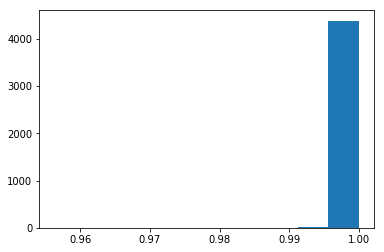

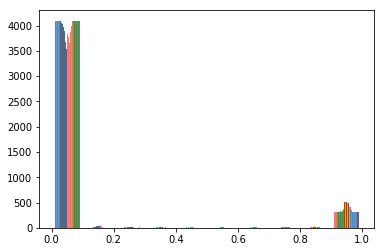

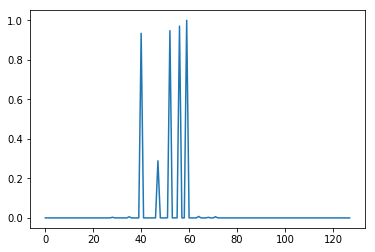

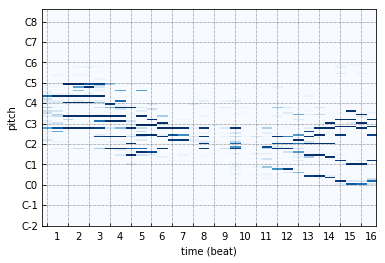

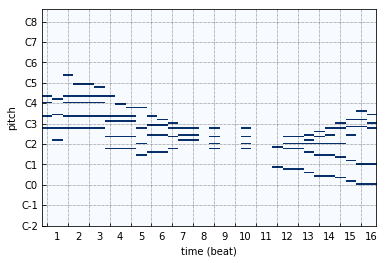

...

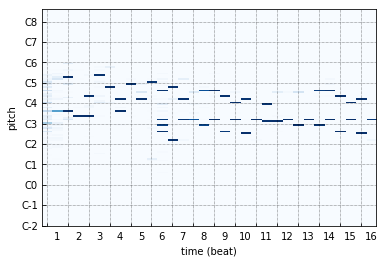

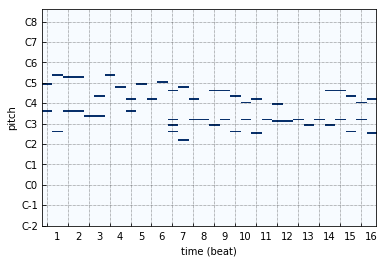

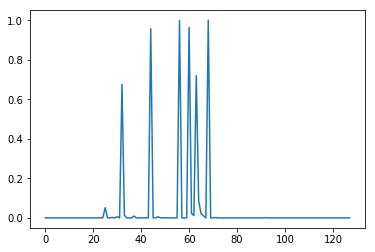

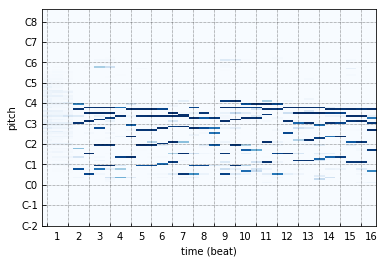

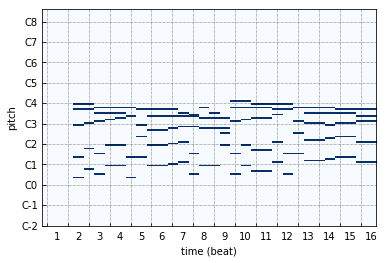

In [16]:
# Predicting across training data to see how well it performs over it.
a = model.predict(train_xs,  verbose=True)
maxes = [np.max(c) for c in a]
plt.hist(maxes)
plt.show()
plt.hist(a[:,-1])
plt.show()
b = np.max(a[1][-1])
plt.plot(a[1][-1])
plt.show()
prep.visualize_piano_roll(a[0].T, fs=2)
prep.visualize_piano_roll(train_xs[0].T, fs=2)
plt.plot(a[100][-1])
plt.show()
prep.visualize_piano_roll(a[100].T, fs=2)
prep.visualize_piano_roll(train_xs[100].T, fs=2)
plt.plot(a[200][-1])
plt.show()
prep.visualize_piano_roll(a[200].T, fs=2)
prep.visualize_piano_roll(train_xs[200].T, fs=2)

In [48]:
def make_song_from_predict(model, initial_data, limit):
    song = []
    keep_producing = True
    prev_data = initial_data
    while keep_producing and len(song) < limit:
        predictions = model.predict(np.array([prev_data]))[0]
        labels = np.zeros(128)
        labels[predictions[-1]/np.max(predictions[-1])>0.75] = 1 # Threshold to consider the key as active, binarized based on this
        keep_producing = np.sum(labels) != len(labels)
        song.append(labels)
        prev_data = np.append(prev_data[1:], [labels], 0)
    return np.array(song)
 
length = 100
song1 = make_song_from_predict(model, train_xs[1], length)
song2 = make_song_from_predict(model, train_xs[42], length)
song3 = make_song_from_predict(model, train_xs[123], length)
prep.embed_play_v1(song1.T, fs=2)


In [49]:
prep.embed_play_v1(song2.T, fs=2)

In [50]:
prep.embed_play_v1(song3.T, fs=2)

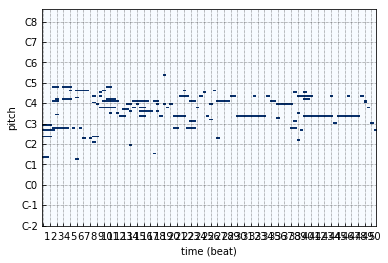

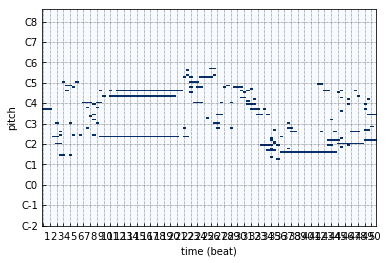

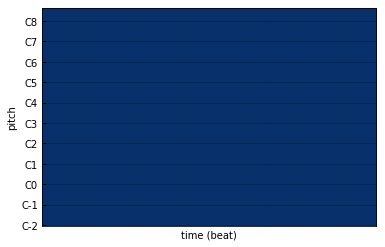

In [51]:
#actual = train_xs[initial_step+1]
#for i in range(1, length//sequence_length):
#    actual = np.append(actual, train_xs[initial_step+1+i], axis=0)

prep.visualize_piano_roll(song1.T, fs=2)
prep.visualize_piano_roll(song2.T, fs=2)
prep.visualize_piano_roll(song3.T, fs=2)
#prep.visualize_piano_roll(actual.T, fs=2)
#prep.embed_play_v1(actual.T, fs=2)

In [52]:
song1_volume = np.zeros(song1.shape)
song1_volume[song1>0] = 100
song2_volume = np.zeros(song2.shape)
song2_volume[song2>0] = 100
song3_volume = np.zeros(song3.shape)
song3_volume[song3>0] = 100

In [53]:
prep.piano_roll_to_mid_file(song1_volume.T, "song1_generalist_fs2.midi", fs=2)

'C:\\Users\\hanak\\dev\\python\\ai\\music\\song1_generalist_fs2.midi'

In [54]:
prep.piano_roll_to_mid_file(song2_volume.T, "song2_generalist_fs2.midi", fs=2)

'C:\\Users\\hanak\\dev\\python\\ai\\music\\song2_generalist_fs2.midi'

In [55]:
prep.piano_roll_to_mid_file(song3_volume.T, "song3_generalist_fs2.midi", fs=2)

'C:\\Users\\hanak\\dev\\python\\ai\\music\\song3_generalist_fs2.midi'

In [12]:
# Here is the combined generalist and specialist model. The weights from the generalist are loaded back into this model.

# The specialist takes the one-hot encoding of the composer and outputs an initial state c for the first LSTM cell.
specialist_input = Input(shape=(composer_encoding_len,))
x = Dense(32, activation=None)(specialist_input) # activation = None makes activation linear
x = LeakyReLU()(x) # Here a LeakyReLU as the weights of first layers turned out VERY low, want to prevent my specialist dying initially.
specialist_output_c = Dense(num_keys, activation=None)(x)
specialist_output_c = LeakyReLU()(specialist_output_c) # Same as above, want to avoid dying neurons.
specialist_output_h = Dropout(1.0)(specialist_output_c) 
# Hax to privde 0 as initial h 
# The "h" of the hidden state is supposed to represent the output from the previous cell, but there is none, as this is the first.
# The "c" howevere, represents the cell state, and is more fit to carry this information.

# Here is the same generalist as above, with the exception of setting the initial state of the first LSTM.
inputs = Input(shape=(sequence_length, num_keys), name="input")
lstm1 = LSTM(num_keys,
               return_sequences=True,
               activation="relu",
               name="lstm1")
# [h = prev output, c = memory], this is where the generalist and the specialist connect
lstm1_outputs = lstm1(inputs, initial_state=[specialist_output_h, specialist_output_c]) 

normalized1 = BatchNormalization()(lstm1_outputs)
dense1 = Dense(num_keys, activation="relu", name="dense1")(normalized1)

lstm2 = LSTM(num_keys,
               return_sequences=True)(dense1)

normalized2 = BatchNormalization()(lstm2)
dense2 = Dense(num_keys, activation="relu", name="dense2")(normalized2)

lstm3 = LSTM(num_keys, activation="relu", return_sequences=True, name="lstm3")(dense2)
normalized3 = BatchNormalization()(lstm3)

outputs = TimeDistributed(Dense(num_keys, activation="sigmoid", name="outputs"))(normalized3)

specialist_model = Model([inputs, specialist_input], outputs)

adam = Adam(lr=0.001, amsgrad=True) 

# Load weights from generalist into this model
specialist_model.load_weights("./models/nostate_32_offset_2_generalist_weights.h5", by_name=True)

specialist_model.compile(loss='binary_crossentropy',
              optimizer=adam,
              metrics=['categorical_accuracy'])

print(specialist_model.summary())

specialist_model.fit([train_xs, train_composers], train_ys,
          epochs=150,
          batch_size=32,
          shuffle=True, # shuffle here but not when constructing set to be able to validate later on :)
          validation_data=([test_xs, test_composers], test_ys),
          )

# Commented out to prevent accidentaly overwriting my model!
# specialist_model.save("./models/nostate_32_offset_2_generalist_specialist.h5")

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 4)            0                                            
__________________________________________________________________________________________________
dense_16 (Dense)                (None, 32)           160         input_7[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_12 (LeakyReLU)      (None, 32)           0           dense_16[0][0]                   
__________________________________________________________________________________________________
dense_17 (Dense)                (None, 128)          4224        leaky_re_lu_12[0][0]             
__________________________________________________________________________________________________
leaky_re_l

Epoch 74/150
4421/4421 [==============================] - 17s 4ms/step - loss: 0.0336 - categorical_accuracy: 0.3003 - val_loss: 0.0501 - val_categorical_accuracy: 0.2934
Epoch 75/150
4421/4421 [==============================] - 17s 4ms/step - loss: 0.0347 - categorical_accuracy: 0.2973 - val_loss: 0.0504 - val_categorical_accuracy: 0.3035
Epoch 76/150
4421/4421 [==============================] - 17s 4ms/step - loss: 0.0341 - categorical_accuracy: 0.3002 - val_loss: 0.0499 - val_categorical_accuracy: 0.3062
Epoch 77/150
4421/4421 [==============================] - 17s 4ms/step - loss: 0.0335 - categorical_accuracy: 0.3033 - val_loss: 0.0493 - val_categorical_accuracy: 0.3068
Epoch 78/150
4421/4421 [==============================] - 17s 4ms/step - loss: 0.0323 - categorical_accuracy: 0.3069 - val_loss: 0.0490 - val_categorical_accuracy: 0.3095
Epoch 79/150
4421/4421 [==============================] - 17s 4ms/step - loss: 0.0326 - categorical_accuracy: 0.3088 - val_loss: 0.0511 - val_cat

Epoch 122/150
4421/4421 [==============================] - 17s 4ms/step - loss: 0.0272 - categorical_accuracy: 0.3388 - val_loss: 0.0471 - val_categorical_accuracy: 0.3410
Epoch 123/150
4421/4421 [==============================] - 17s 4ms/step - loss: 0.0261 - categorical_accuracy: 0.3437 - val_loss: 0.0450 - val_categorical_accuracy: 0.3543
Epoch 124/150
4421/4421 [==============================] - 17s 4ms/step - loss: 0.0267 - categorical_accuracy: 0.3444 - val_loss: 0.0451 - val_categorical_accuracy: 0.3529
Epoch 125/150
4421/4421 [==============================] - 17s 4ms/step - loss: 0.0251 - categorical_accuracy: 0.3509 - val_loss: 0.0468 - val_categorical_accuracy: 0.3492
Epoch 126/150
4421/4421 [==============================] - 17s 4ms/step - loss: 0.0243 - categorical_accuracy: 0.3541 - val_loss: 0.0439 - val_categorical_accuracy: 0.3521
Epoch 127/150
4421/4421 [==============================] - 17s 4ms/step - loss: 0.0237 - categorical_accuracy: 0.3544 - val_loss: 0.0438 - v

c:\users\hanak\dev\composer\venv\lib\site-packages\keras\engine\network.py:877: UserWarning: Layer lstm1 was passed non-serializable keyword arguments: {'initial_state': [<tf.Tensor 'dropout_2/Identity:0' shape=(?, 128) dtype=float32>, <tf.Tensor 'leaky_re_lu_13/LeakyRelu:0' shape=(?, 128) dtype=float32>]}. They will not be included in the serialized model (and thus will be missing at deserialization time).
  '. They will not be included '


mz


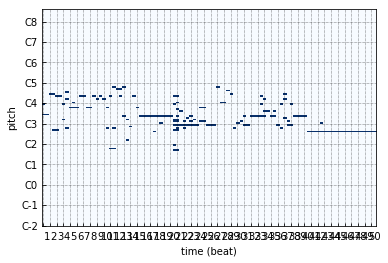

brahms


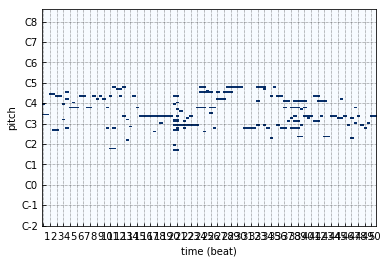

debussy


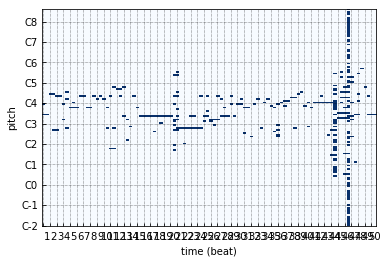

bach


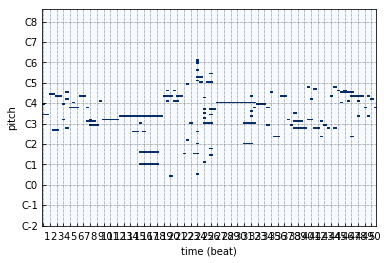

brahms


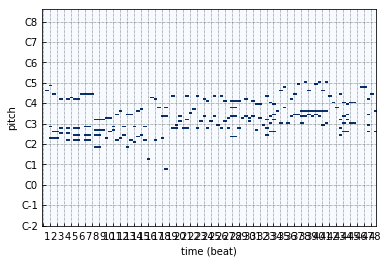

In [18]:
def make_song_from_predict_composer(model, initial_data, composer, limit):
    song = []
    keep_producing = True
    prev_data = initial_data
    while keep_producing and len(song) < limit:
        predictions = model.predict([np.array([prev_data]), composer])[0]
        labels = np.zeros(128)
        labels[predictions[-1]/np.max(predictions[-1])>0.75] = 1 # Threshold to consider the key as active, binarized based on this
        keep_producing = np.sum(labels) != len(labels)
        song.append(labels)
        prev_data = np.append(prev_data[1:], [labels], 0)
    return np.array(song)

initial_step = 42 # 0, 42, 123
length = 100
song1 = make_song_from_predict_composer(specialist_model, train_xs[initial_step], np.array([[1.0, 0.0, 0.0, 0.0]]), length)
song2 = make_song_from_predict_composer(specialist_model, train_xs[initial_step], np.array([[0.0, 1.0, 0.0, 0.0]]), length)
song3 = make_song_from_predict_composer(specialist_model, train_xs[initial_step], np.array([[0.0, 0.0, 1.0, 0.0]]), length)
song4 = make_song_from_predict_composer(specialist_model, train_xs[initial_step], np.array([[0.0, 0.0, 0.0, 1.0]]), length)
actual = train_xs[initial_step+1]
for i in range(1, length//sequence_length):
    actual = np.append(actual, train_xs[initial_step+1+i], axis=0)

print(int_to_name[0])
prep.visualize_piano_roll(song1.T, fs=2)
print(int_to_name[1])
prep.visualize_piano_roll(song2.T, fs=2)
print(int_to_name[2])
prep.visualize_piano_roll(song3.T, fs=2)
print(int_to_name[3])
prep.visualize_piano_roll(song4.T, fs=2)
print(int_to_name[list(train_composers[initial_step]).index(1)])
prep.visualize_piano_roll(actual.T, fs=2)


bach


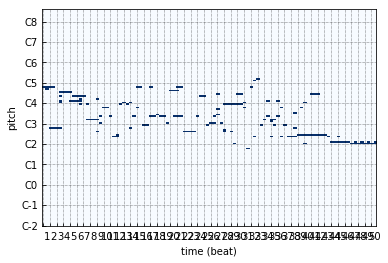

brahms


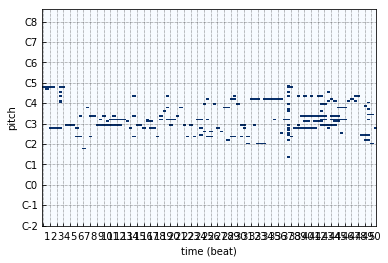

mz


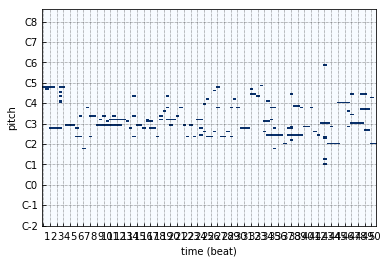

debussy


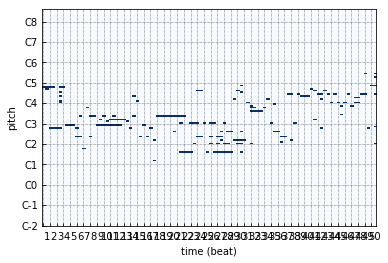

mz


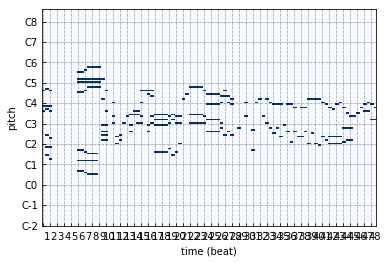

In [10]:
specialist_model_loaded = load_model("./models/nostate_32_offset_2_generalist_specialist.h5")

def make_song_from_predict_composer(model, initial_data, composer, limit):
    song = []
    keep_producing = True
    prev_data = initial_data
    while keep_producing and len(song) < limit:
        predictions = model.predict([np.array([prev_data]), composer])[0]
        labels = np.zeros(128)
        labels[predictions[-1]/np.max(predictions[-1])>0.75] = 1 # Threshold to consider the key as active, binarized based on this
        keep_producing = np.sum(labels) != len(labels)
        song.append(labels)
        prev_data = np.append(prev_data[1:], [labels], 0)
    return np.array(song)

initial_step = 500 # 500, 69, 666
length = 100
song1 = make_song_from_predict_composer(specialist_model_loaded, train_xs[initial_step], np.array([[1.0, 0.0, 0.0, 0.0]]), length)
song2 = make_song_from_predict_composer(specialist_model_loaded, train_xs[initial_step], np.array([[0.0, 1.0, 0.0, 0.0]]), length)
song3 = make_song_from_predict_composer(specialist_model_loaded, train_xs[initial_step], np.array([[0.0, 0.0, 1.0, 0.0]]), length)
song4 = make_song_from_predict_composer(specialist_model_loaded, train_xs[initial_step], np.array([[0.0, 0.0, 0.0, 1.0]]), length)
actual = train_xs[initial_step+1]
for i in range(1, length//sequence_length):
    actual = np.append(actual, train_xs[initial_step+1+i], axis=0)

print(int_to_name[0])
prep.visualize_piano_roll(song1.T, fs=2)
print(int_to_name[1])
prep.visualize_piano_roll(song2.T, fs=2)
print(int_to_name[2])
prep.visualize_piano_roll(song3.T, fs=2)
print(int_to_name[3])
prep.visualize_piano_roll(song4.T, fs=2)
print(int_to_name[list(train_composers[initial_step]).index(1)])
prep.visualize_piano_roll(actual.T, fs=2)

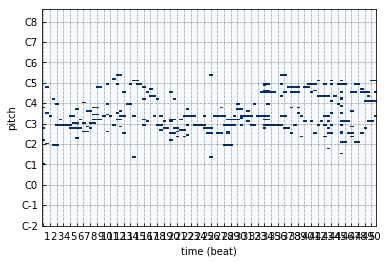

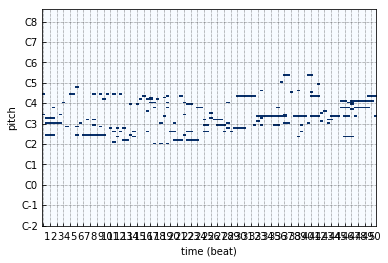

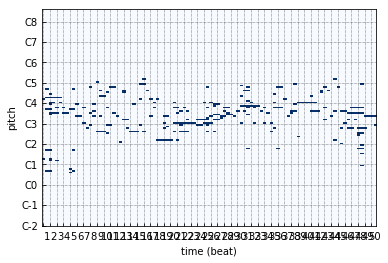

In [14]:
generalist_model_loaded = load_model("./models/nostate_32_offset_2_generalist.h5")
length = 100
song1 = make_song_from_predict(generalist_model_loaded, train_xs[1], length)
song2 = make_song_from_predict(generalist_model_loaded, train_xs[42], length)
song3 = make_song_from_predict(generalist_model_loaded, train_xs[123], length)
prep.visualize_piano_roll(song1.T, fs=2)
prep.visualize_piano_roll(song2.T, fs=2)
prep.visualize_piano_roll(song3.T, fs=2)

[<keras.engine.input_layer.InputLayer object at 0x00000265C17275C0>, <keras.layers.core.Dense object at 0x00000265C1727400>, <keras.layers.advanced_activations.LeakyReLU object at 0x00000265C1727780>, <keras.layers.core.Dense object at 0x00000265C1727240>, <keras.layers.advanced_activations.LeakyReLU object at 0x00000265C17272E8>, <keras.engine.input_layer.InputLayer object at 0x00000265C1727AC8>, <keras.layers.core.Dropout object at 0x00000265C1727860>, <keras.layers.recurrent.LSTM object at 0x00000265C1727D68>, <keras.layers.normalization.BatchNormalization object at 0x00000265C1727828>, <keras.layers.core.Dense object at 0x00000265C1727D30>, <keras.layers.recurrent.LSTM object at 0x00000265C1734048>, <keras.layers.normalization.BatchNormalization object at 0x00000265C1734208>, <keras.layers.core.Dense object at 0x00000265C1734320>, <keras.layers.recurrent.LSTM object at 0x00000265C1734470>, <keras.layers.normalization.BatchNormalization object at 0x00000265C1734630>, <keras.layers.w

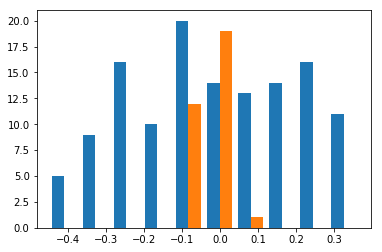

dense_17


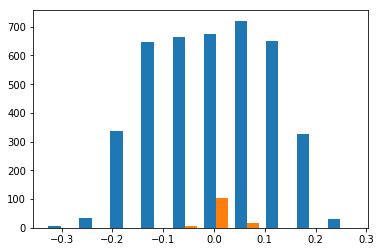

In [22]:
specialist_model_loaded = load_model("./models/nostate_32_offset_2_generalist_specialist.h5")
print(specialist_model_loaded.layers)
print(specialist_model_loaded.layers[1].name)
plt.hist(specialist_model_loaded.layers[1].get_weights())
plt.show()
print(specialist_model_loaded.layers[3].name)
plt.hist(specialist_model_loaded.layers[3].get_weights())
plt.show()

in the style of debussy with fs2, as trained


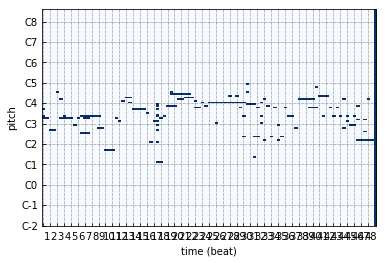

In [33]:
generalist = load_model("./models/nostate_32_offset_2_generalist.h5")
specialist = load_model("./models/nostate_32_offset_2_generalist_specialist.h5")

def play_from_given_song(fpath, composer, use_specialist=True, fs=2):
    song = pd.read_csv(fpath).values[:, 1:]
    song = song.T
    song = (song > 0.0).astype(np.int_)
    song_start = np.array(song[:32])
    length = 100
    if not use_specialist:
        generalist_song = make_song_from_predict(generalist, song_start, length)
        prep.visualize_piano_roll(generalist_song.T, fs=fs)
        generated = np.zeros(generalist_song.shape)
        generated[generalist_song>0] = 100
        prep.piano_roll_to_mid_file(generated.T, "generated_generalist.midi", fs=fs)
    else:
        specialist_song = make_song_from_predict_composer(specialist, song_start, composer, length)
        prep.visualize_piano_roll(specialist_song.T, fs=fs)
        generated = np.zeros(specialist_song.shape)
        generated[specialist_song>0] = 100
        prep.piano_roll_to_mid_file(generated.T, "generated_specialist.midi", fs=fs)
    
print("in the style of", int_to_name[name_to_int["debussy"]], "with fs2, as trained")
play_from_given_song("./assignment/datasets/training/piano_roll_fs2/debussy_cc_3.csv",
                     composer=np.array([[1.0, 0.0, 0.0, 0.0]]),
                     use_specialist=True,
                     fs=2)
    
    

generalist with fs2


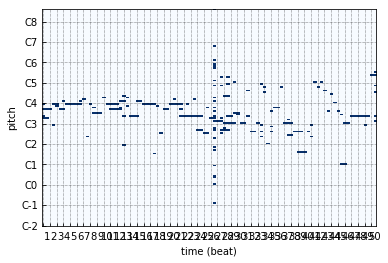

In [34]:
print("generalist with fs2")    
play_from_given_song("./assignment/datasets/training/piano_roll_fs2/debussy_cc_3.csv",
                     composer=np.array([[1.0, 0.0, 0.0, 0.0]]),
                     use_specialist=False,
                     fs=2)

In [35]:
print(int_to_name.items())

dict_items([(0, 'debussy'), (1, 'mz'), (2, 'bach'), (3, 'brahms')])
